# Interpreting what convnets learn
A fundamental problem when building a computer vision application is that of **interpretability**: 

_<<Why did your classifier think a particular image contained a fridge, when all you can see is a truck?>>_

It’s often said that deep learning models are “black boxes”: they learn representations that are difficult to extract and present in a human-readable form. Although this is partially true for certain types of deep learning models, it’s definitely not true for convnets.

The representations learned by convnets are highly amenable to visualization, in large part because they’re representations of visual concepts. 

Since 2013, a wide array of techniques has been developed for visualizing and interpreting these representations. We won’t survey all of them, but we’ll cover three of the most accessible and useful ones:

## Visualizing intermediate activations
Visualizing intermediate activations consists of displaying the values returned by various convolution and pooling layers in a model, given a certain input.

We want to visualize feature maps with three dimensions: width, height, and depth (channels). Each channel encodes relatively independent features, so the proper way to visualize these feature maps is by independently plotting the contents of every channel as a 2D image.

### Loading the model
Let’s start by loading the model that we trained and saved in [ch. 8-2 notebook](https://github.com/andreaceto/deep-learning-with-python/blob/main/ch08-2_CNN-from-scratch.ipynb).

In [1]:
from tensorflow import keras
model = keras.models.load_model("convnet_from_scratch_with_augmentation.keras")
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 178, 178, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 89, 89, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 87, 87, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 43, 43, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 41, 41, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 20, 20, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 7, 7, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        12,545 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,982,084 (7.56 MB)

 Trainable params: 991,041 (3.78 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 991,043 (3.78 MB)

### Preprocessing a single image
Next, we’ll get an input image $-$ a picture of a cat, not part of the images the network was trained on.

In [2]:
from tensorflow import keras
import numpy as np

# Download a test image
img_path = keras.utils.get_file(
	fname="cat.jpg",
	origin="https://img-datasets.s3.amazonaws.com/cat.jpg")

def get_img_array(img_path, target_size):
	# Open the image file and resize it
	img = keras.utils.load_img(
		img_path, target_size=target_size)
	
	# Turn the image into a float32 NumPy array of shape (180, 180, 3)
	array = keras.utils.img_to_array(img)
	
	#Add a dimension to transform the array into a “batch” of a single sample. Its shape is now (1, 180, 180, 3).
	array = np.expand_dims(array, axis=0)
	return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

80329/80329 ━━━━━━━━━━━━━━━━━━━━ 1s 17us/step


### Displaying the test picture

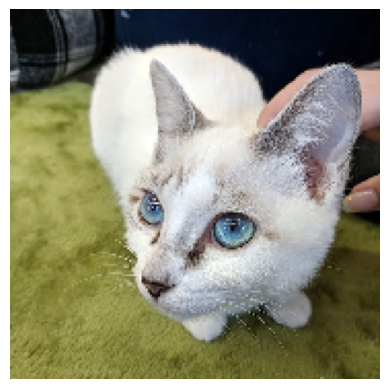

In [3]:
import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

### Instantiating a model that returns layer activations
In order to extract the feature maps we want to look at, we’ll create a Keras model that takes batches of images as input, and that outputs the activations of all convolution and pooling layers.

In [4]:
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        # Extract the outputs of all Conv2D and MaxPooling2D layers and put them in a list
        layer_outputs.append(layer.output)
        # Save the layer names for later
        layer_names.append(layer.name)

# Create a model that will return activation outputs, given the model input
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

### Using the model to compute layer activations

In [5]:
activations = activation_model.predict(img_tensor)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 984ms/step


For instance, this is the activation of the first convolution layer for the cat image input:

In [6]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 178, 178, 32)


It’s a 178 × 178 feature map with 32 channels.

### Visualizing the fifth channel
Let’s try plotting the fifth channel of the activation of the first layer of the original model.

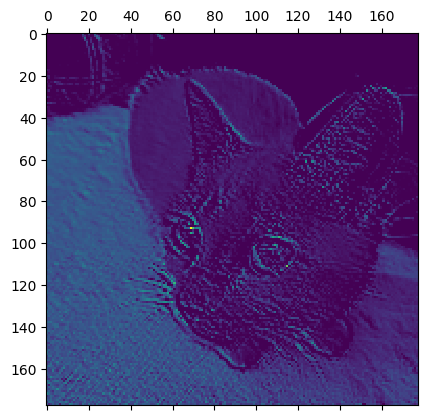

In [7]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0, :, :, 5], cmap="viridis")

### Visualizing every intermediate activation
Now, let’s plot a complete visualization of all the activations in the network. We’ll extract and plot every channel in each of the layer activations, and we’ll stack the results in one big grid, with channels stacked side by side.

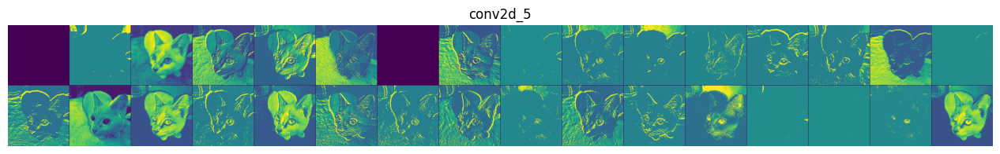

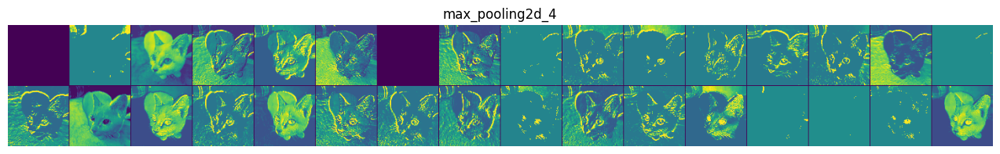

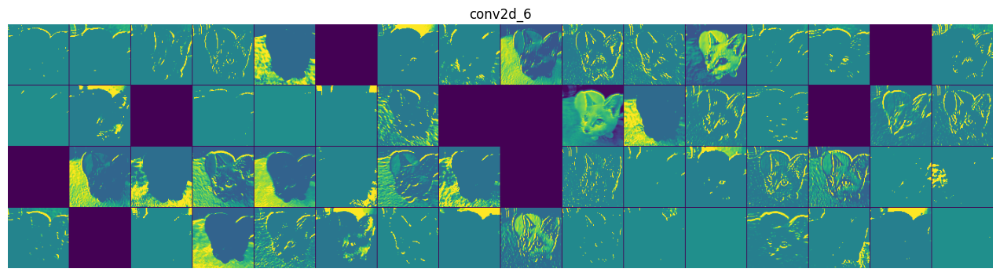

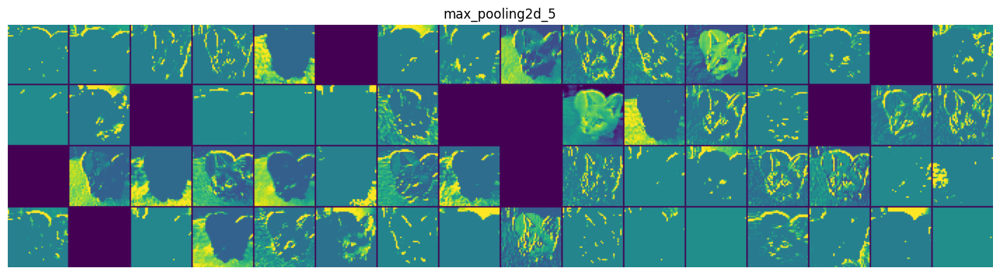

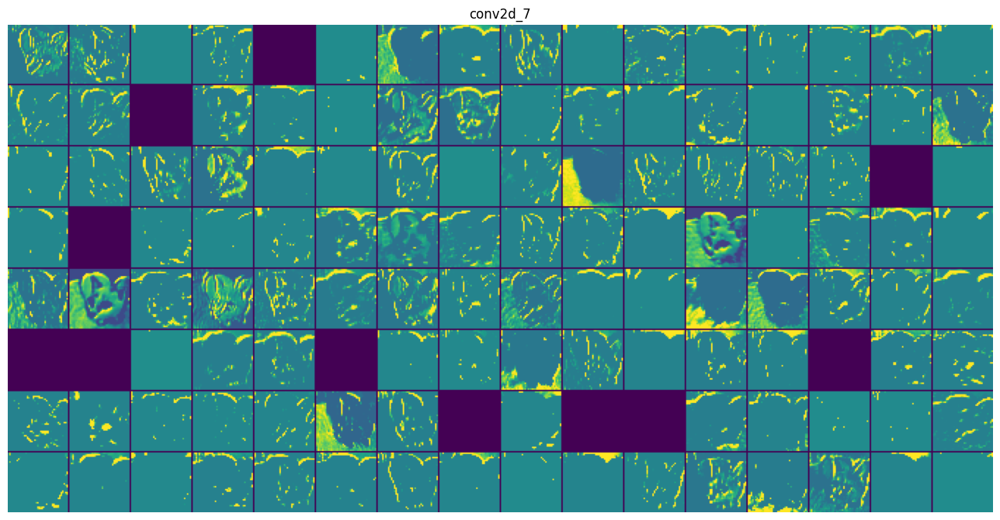

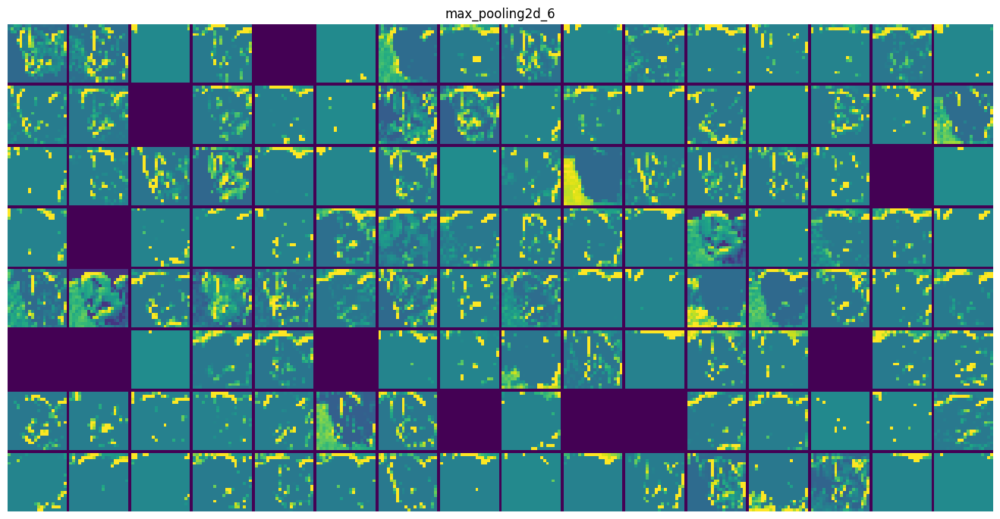

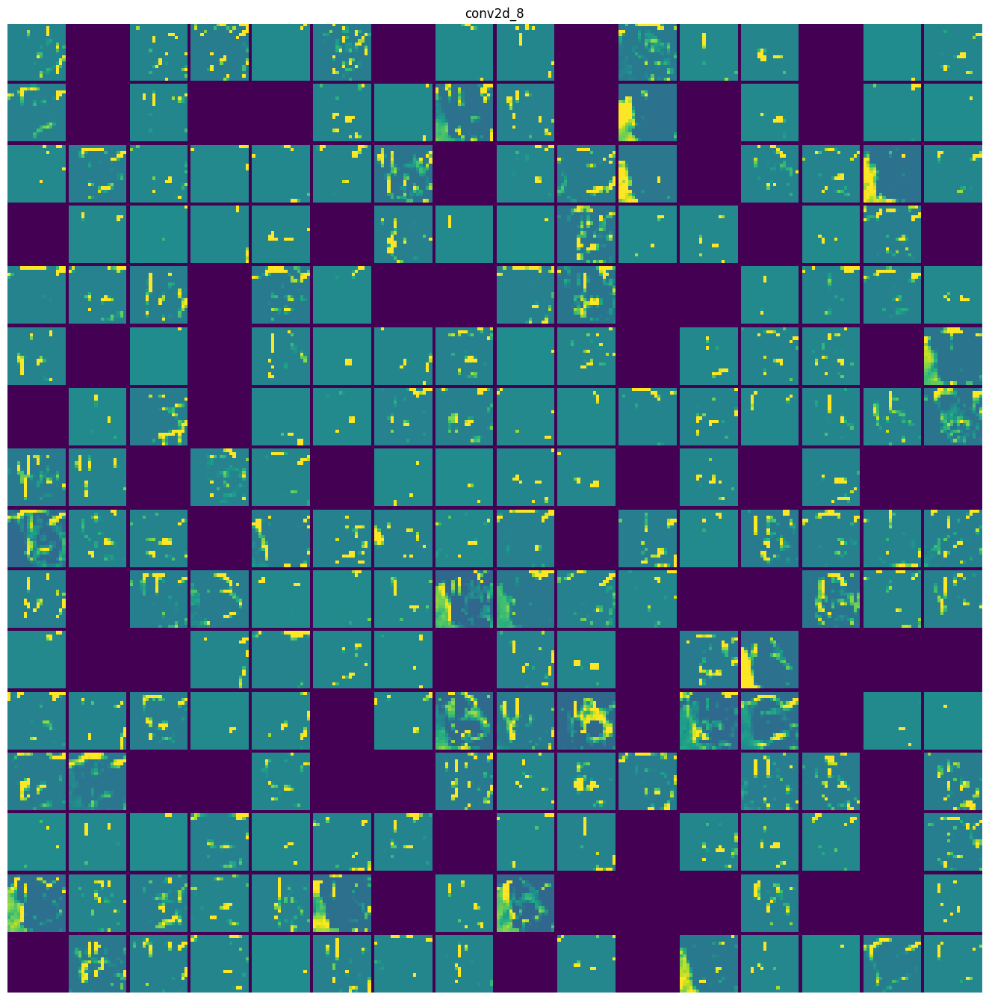

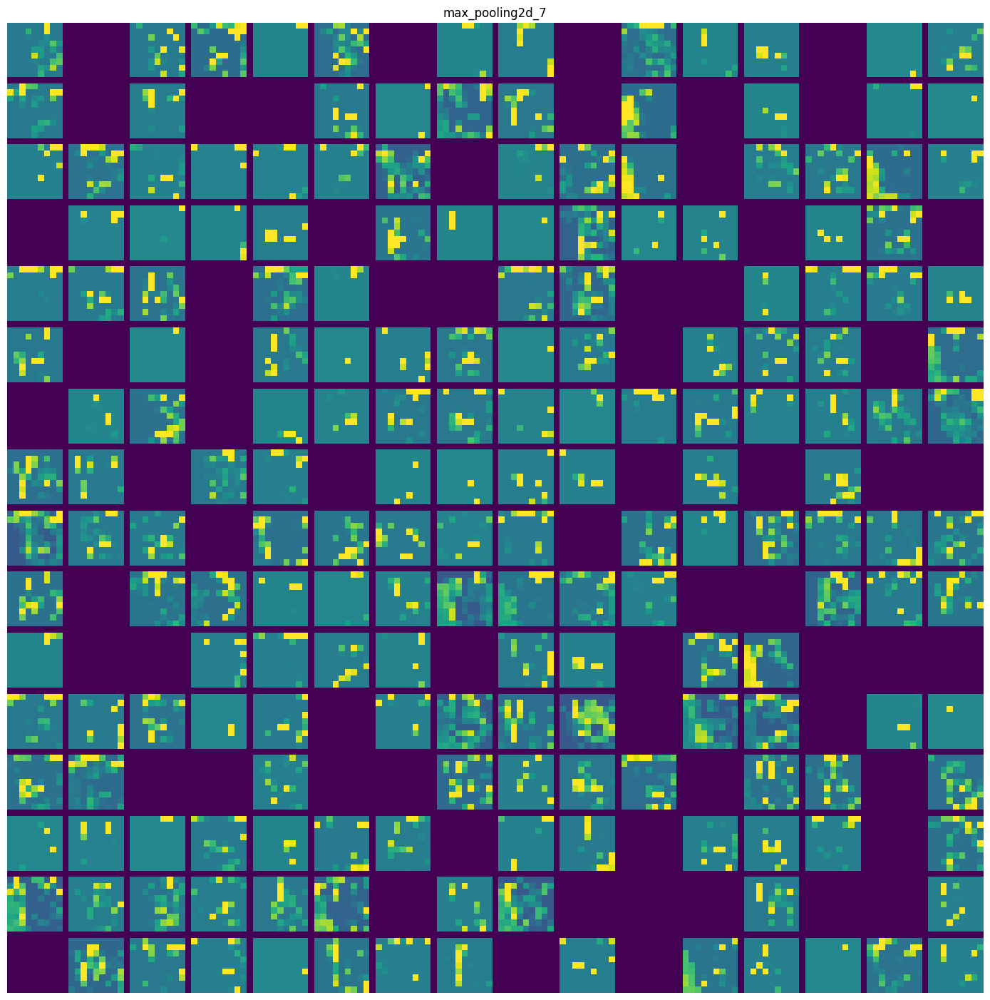

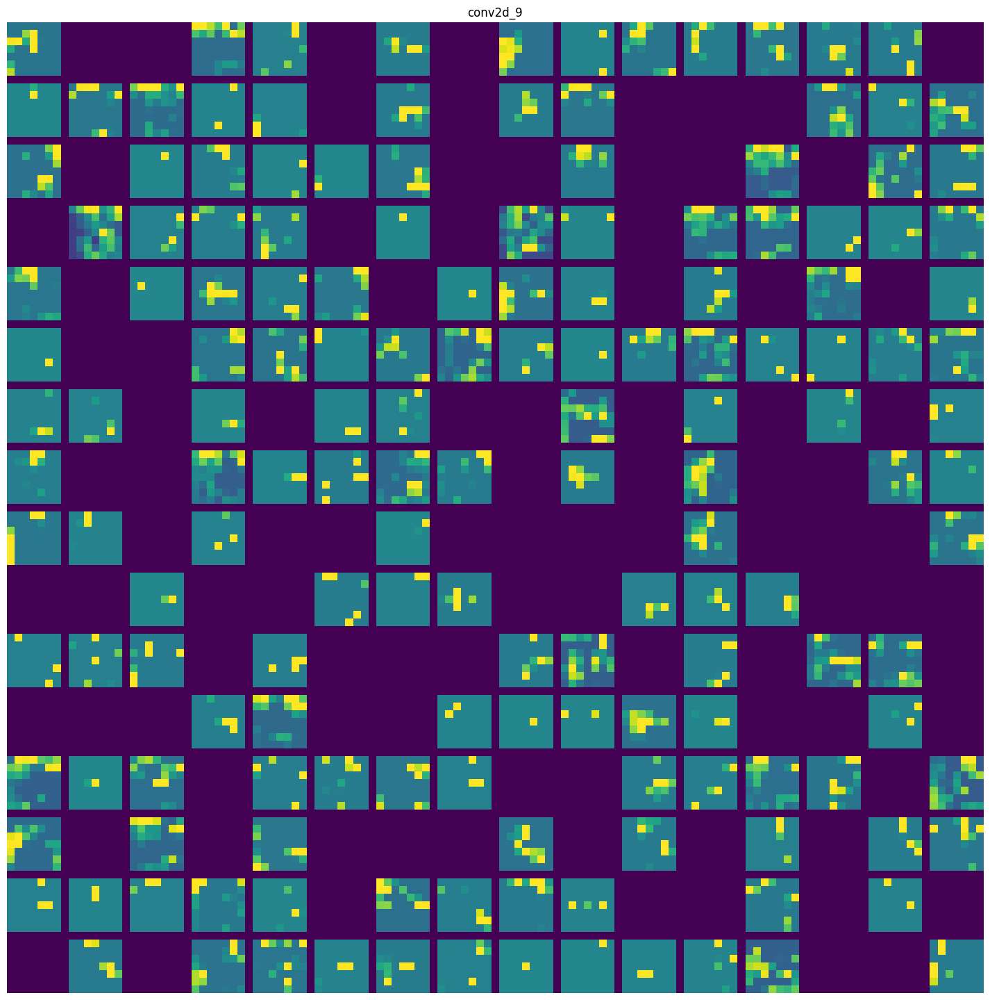

In [8]:
images_per_row = 16

# Iterate over the activations (and the names of the corresponding layers)
for layer_name, layer_activation in zip(layer_names, activations):
    # The layer activation has shape (1, size, size, n_features)
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    
    # Prepare an empty grid for displaying all the channels in this activation
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()  # This is a single channel (or feature)
            
            # NoNormalize channel values within the [0, 255] range. All-zero channels are kept at zero
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            
            # Place the channel matrix in the empty grid
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    
    # Display the grid for the layer
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

## Visualizing convnet filters
Another easy way to inspect the filters learned by convnets is to display the visual pattern that each filter is meant to respond to.

This can be done with **gradient ascent** in input space: applying gradient descent to the value of the input image of a convnet so as to maximize the response of a specific filter, starting from a blank input image. The resulting input image will be one that the chosen filter is maximally responsive to.

### Instantiating the Xception convolutional base
First, let’s instantiate the Xception model, loaded with weights pretrained on the ImageNet dataset.

In [9]:
model = keras.applications.xception.Xception(
    weights="imagenet",
    include_top=False)

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step


### Printing the names of all convolutional layers in Xception
We’re interested in the convolutional layers of the model $-$ the ```Conv2D``` and ```SeparableConv2D``` layers. We’ll need to know their names so we can retrieve their outputs. Let’s print their names, in order of depth.

In [10]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d
block3_sepconv1
block3_sepconv2
conv2d_1
block4_sepconv1
block4_sepconv2
conv2d_2
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_3
block14_sepconv1
block14_sepconv2


You’ll notice that the ```SeparableConv2D``` layers here are all named something like ```block6_sepconv1```, ```block7_sepconv2```, etc. Xception is structured into blocks, each containing several convolutional layers.

### Creating a feature extractor model
Now, let’s create a second model that returns the output of a specific layer $-$ a feature extractor model.

Because our model is a Functional API model, it is inspectable: we can query the output of one of its layers and reuse it in a new model. No need to copy the entire Xception code.

In [11]:
layer_name = "block3_sepconv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

### Using the feature extractor
To use this model, simply call it on some input data (note that Xception requires inputs to be preprocessed via the ```keras.applications.xception.preprocess_input``` function).

In [12]:
activation = feature_extractor(
    keras.applications.xception.preprocess_input(img_tensor)
)

### Defining the loss function
Let’s use our feature extractor model to define a function that returns a scalar value quantifying how much a given input image “activates” a given filter in the layer.

This is the “loss function” that we’ll maximize during the gradient ascent process.

In [ ]:
import tensorflow as tf

# The loss function takes an image tensor and the index of the filter we are considering (an integer)
def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    # Note that we avoid border artifacts by only involving non-border pixels in the loss:
    # we discard the first two pixels along the sides of the activation.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    # Return the mean of the activation values for the filter
    return tf.reduce_mean(filter_activation)

**The difference between model.predict(x) and model(x)**

In the previous chapter, we used ```predict(x)``` for feature extraction. Here, we’re using ```model(x)```(_activation = feature_extractor(image)_). What gives?

Both ```y = model.predict(x)``` and ```y = model(x)``` (where x is an array of input data) mean _“run the model on x and retrieve the output y”_. Yet they aren’t exactly the same thing.

- **predict(x)** loops over the data in batches (in fact, you can specify the batch size via ```predict(x, batch_size=64)```), and it extracts the NumPy value of the outputs. This means that _predict()_ calls can scale to very large arrays.
- **model(x)** happens in-memory and doesn’t scale. On the other hand, predict() is not differentiable: you cannot retrieve its gradient if you call it in a ```GradientTape``` scope.


You should use _model(x)_ when you need to retrieve the gradients of the model call, and you should use _predict()_ if you just need the output value. In other words, always use _predict()_ unless you’re in the middle of writing a low-level gradient descent loop (as we are now).

### Loss maximization via stochastic gradient ascent
Let’s set up the gradient ascent step function, using the ```GradientTape```. Note that we’ll use a ```@tf.function``` decorator to speed it up.

A non-obvious trick to help the gradient descent process go smoothly is to normalize the gradient tensor by dividing it by its L2 norm (the square root of the average of the square of the values in the tensor). This ensures that the magnitude of the updates done to the input image is always within the same range.

In [14]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        # Explicitly watch the image tensor, since it isn’t a TensorFlow Variable
        tape.watch(image)
        # Compute the loss scalar, indicating how much the current image activates the filter
        loss = compute_loss(image, filter_index)
    
    grads = tape.gradient(loss, image)  # Compute the gradients of the loss with respect to the image
    grads = tf.math.l2_normalize(grads)  # Apply the “gradient normalization trick”
    image += learning_rate * grads  # Move the image a little bit in a direction that activates our target filter more strongly
    
    return image  # Return the updated image so we can run the step function in a loop

### Function to generate filter visualization


In [15]:
img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30  # Number of gradient ascent steps to apply
    learning_rate = 10.  # Amplitude of gradient ascent steps to apply
    
    # Initialize an image tensor with random values
    # The Xception model expects input values in the [0, 1] range, so here we pick a range centered on 0.5
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    
    # Repeatedly update the values of the image tensor so as to maximize our loss function
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    
    return image[0].numpy()

### Utility function to convert a tensor into a valid image
The resulting image tensor is a floating-point array of shape $(200, 200, 3)$, with values that may not be integers within $[0, 255]$. Hence, we need to post-process this tensor to turn it into a displayable image.

We do so with the following straightforward utility function.

In [16]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

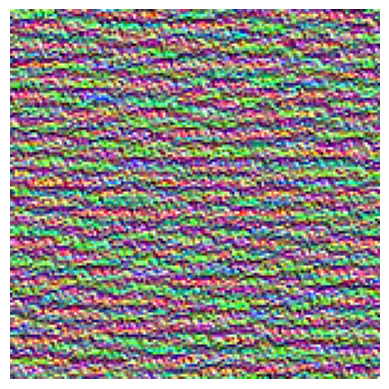

In [20]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

It seems that filter $2$ in layer ```block3_sepconv1``` is responsive to a horizontal lines pattern, somewhat water-like or fur-like.

### Generating a grid of all filter response patterns in a layer

In [21]:
all_images = []

# Generate and save visualizations for the first 64 filters in the layer
for filter_index in range(64):
    print(f"Processing filter {filter_index}")
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)

# Prepare a blank canvas for us to paste filter visualization on
margin = 5
n = 8

cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the picture with the saved filters
for i in range(n):
    for j in range(n):
        image = all_images[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = image

keras.utils.save_img(
    f"images\\filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

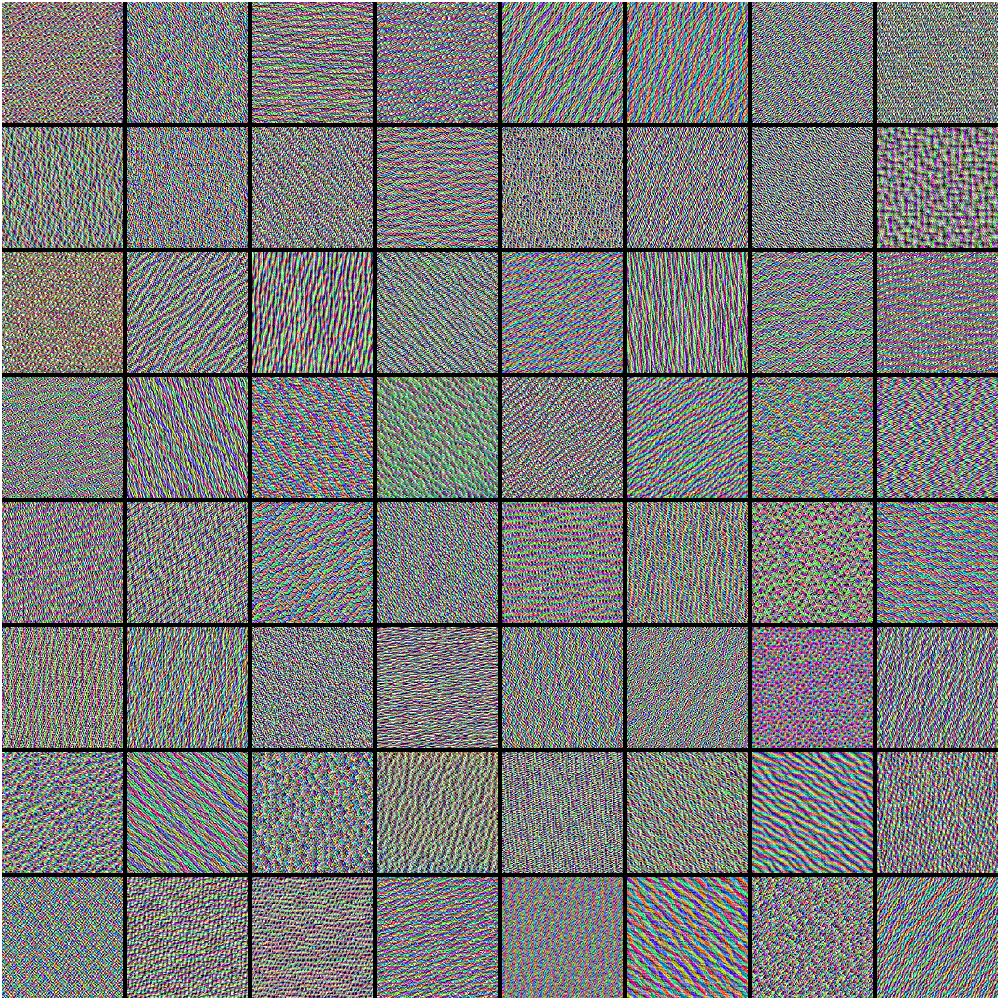

In [28]:
img = keras.utils.load_img("images\\filters_for_layer_block3_sepconv1.png")
array = keras.utils.img_to_array(img)

plt.figure(figsize=(0.05 * array.shape[1], 0.05 * array.shape[0]))
plt.axis("off")
plt.imshow(array.astype("uint8"))

## Visualizing heatmaps of class activation
This general category of techniques is called **Class Activation Map** (CAM) visualization, and it consists of producing heatmaps of class activation over input images. A class activation heatmap is a 2D grid of scores associated with a specific output class, computed for every location in any input image, indicating how important each location is with respect to the class under consideration.

The specific implementation we’ll use is called **Grad-CAM**. **Grad-CAM** consists of taking the output feature map of a convolution layer, given an input image, and weighing every channel in that feature map by the gradient of the class with respect to the channel.

### Loading the Xception network with pretrained weights
Let’s demonstrate this technique using the pretrained Xception model.

In [29]:
model = keras.applications.xception.Xception(weights="imagenet")

91884032/91884032 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


### Preprocessing an input image for Xception
Consider the image of two African elephants. Let’s convert this image into something the Xception model can read: the model was trained on images of size $299 \times 299$, preprocessed according to a few rules that are packaged in the ```keras.applications.xception.preprocess_input``` utility function.

So we need to load the image, resize it to $299 \times 299$, convert it to a NumPy _float32_ tensor, and apply these preprocessing rules.

In [30]:
img_path = keras.utils.get_file(
    fname="elephant.jpg",
    origin="https://img-datasets.s3.amazonaws.com/elephant.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    array = keras.applications.xception.preprocess_input(array)
    return array

img_array = get_img_array(img_path, target_size=(299, 299))

733657/733657 ━━━━━━━━━━━━━━━━━━━━ 1s 1us/step


### Running prediction
You can now run the pretrained network on the image and decode its prediction vector back to a human-readable format:

In [31]:
preds = model.predict(img_array)
print(keras.applications.xception.decode_predictions(preds, top=3)[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step
[('n02504458', 'African_elephant', np.float32(0.86993957)), ('n01871265', 'tusker', np.float32(0.07695632)), ('n02504013', 'Indian_elephant', np.float32(0.023541749))]


The top three classes predicted for this image are as follows:
- African elephant (with $87$ probability)
- Tusker (with $7%$ probability)
- Indian elephant (with $2%$ probability)

The network has recognized the image as containing an undetermined quantity of African elephants. The entry in the prediction vector that was maximally activated is the one corresponding to the “African elephant” class, at index 386:

In [32]:
np.argmax(preds[0])

np.int64(386)

To visualize which parts of the image are the most African-elephant–like, let’s set up the Grad-CAM process.

### Setting up a model that returns the last convolutional output
First, we create a model that maps the input image to the activations of the last convolutional layer.

In [33]:
last_conv_layer_name = "block14_sepconv2_act"
classifier_layer_names = [
    "avg_pool",
    "predictions",
]
last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

### Reapplying the classifier on top of the last convolutional output
Second, we create a model that maps the activations of the last convolutional layer to the final class predictions.

In [34]:
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in classifier_layer_names:
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

### Retrieving the gradients of the top predicted class
Then we compute the gradient of the top predicted class for our input image with respect to the activations of the last convolution layer.

In [35]:
import tensorflow as tf

with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_array)
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]

grads = tape.gradient(top_class_channel, last_conv_layer_output)

c:\Users\aceto\Documents\GitHub\deep-learning-with-python\.venv\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_168']
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


### Gradient pooling and channel-importance weighting
Now we apply pooling and importance weighting to the gradient tensor to obtain our heatmap of class activation.

In [36]:
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]
heatmap = np.mean(last_conv_layer_output, axis=-1)

### Heatmap post-processing
For visualization purposes, we’ll also normalize the heatmap between 0 and 1.

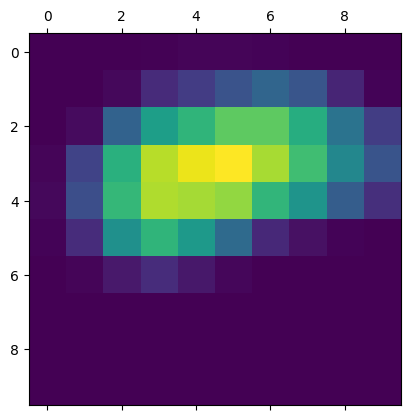

In [37]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

### Superimposing the heatmap on the original picture
Finally, let’s generate an image that superimposes the original image on the heatmap we just obtained.

In [38]:
import matplotlib.cm as cm

img = keras.utils.load_img(img_path)
img = keras.utils.img_to_array(img)

heatmap = np.uint8(255 * heatmap)

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

jet_heatmap = keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)

superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.utils.array_to_img(superimposed_img)

save_path = "images\\elephant_cam.jpg"
superimposed_img.save(save_path)

C:\Users\aceto\AppData\Local\Temp\ipykernel_9236\1527873414.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  jet = cm.get_cmap("jet")


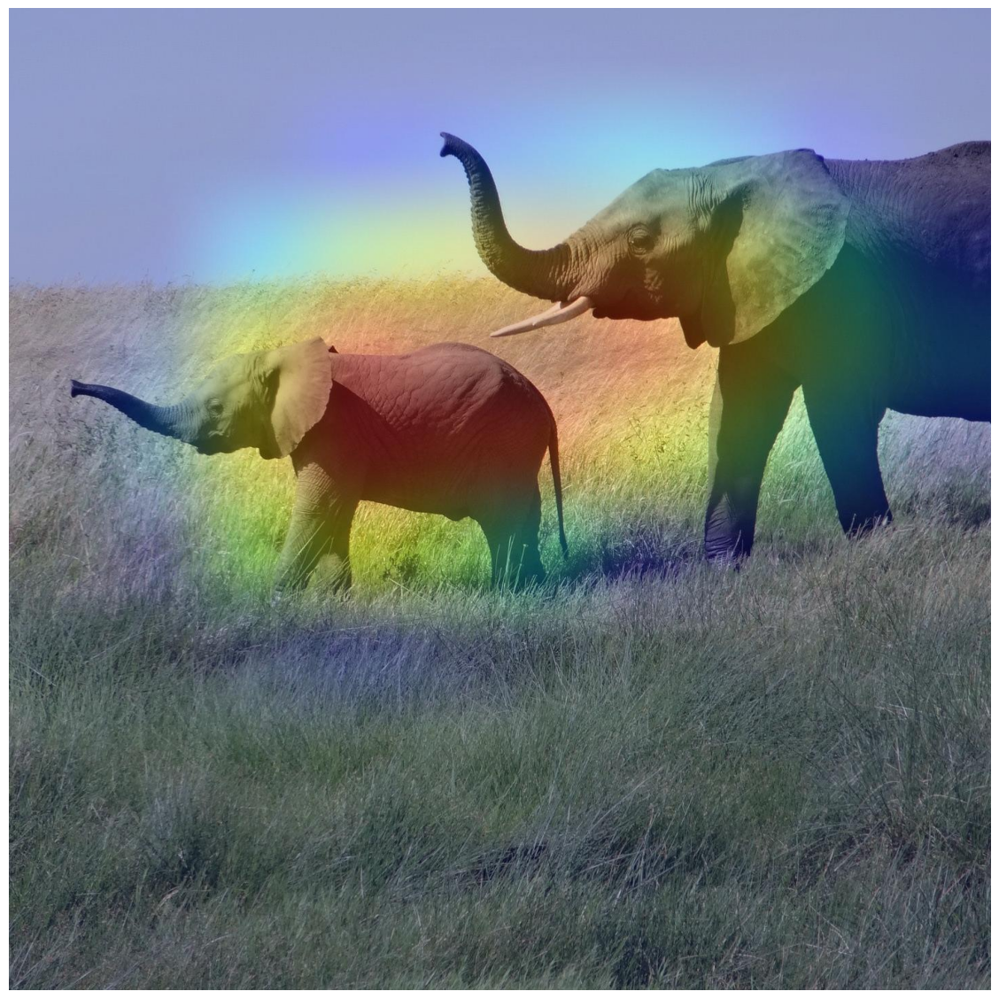

In [40]:
img = keras.utils.load_img(save_path)
array = keras.utils.img_to_array(img)

plt.figure(figsize=(0.01 * array.shape[1], 0.01 * array.shape[0]))
plt.axis("off")
plt.imshow(array.astype("uint8"))

This visualization technique answers two important questions:
- Why did the network think this image contained an African elephant?
- Where is the African elephant located in the picture?

In particular, it’s interesting to note that the ears of the elephant calf are strongly activated: this is probably how the network can tell the difference between African and Indian elephants.